<a href="https://colab.research.google.com/github/gkdivya/EVA/blob/main/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_LN_RedLR/Cifar10_with_resnet34_LN_RedLR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries

In [1]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-tjwc_sny
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-tjwc_sny
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=4295813bfd74635f7e9a75bff0506d817c5049c750bbfd791433eb3848409278
  Stored in directory: /tmp/pip-ephem-wheel-cache-pp2mwmxb/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 252, done.
remote: Counting objects: 100% (252/252), done.
remote: Compressing objects: 100% (242/242), done.
remote: Total 252 (delta 145), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (252/252), 59.99 KiB | 6.00 MiB/s, done.
Resolving deltas: 100% (145/145), done.


In [3]:
!git clone https://github.com/gkdivya/eva.git

Cloning into 'eva'...
remote: Enumerating objects: 2289, done.
remote: Counting objects: 100% (1112/1112), done.
remote: Compressing objects: 100% (751/751), done.
remote: Total 2289 (delta 828), reused 336 (delta 336), pack-reused 1177
Receiving objects: 100% (2289/2289), 27.40 MiB | 8.32 MiB/s, done.
Resolving deltas: 100% (1313/1313), done.


In [4]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [5]:
config = helper.process_config("/content/eva/8_AdvancedTrainingConcepts/experiments/Cifar10_with_resnet34_LN_RedLR/config.yaml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'ReduceLROnPlateau',
 'model': 'Resnet34',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet34_LN_RedLR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_

## Create Training Instance

In [6]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [7]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


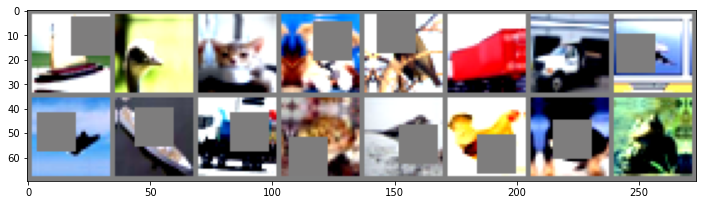

In [8]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [9]:
model = resnet.ResNet34("LN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13           [-1, 64, 32, 32]          36,864
        GroupNorm-14           [-1, 64,

## Trigger training

In [10]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch 1:


Loss=2.142260789871216 Batch_id=195 LR=0.00100 Accuracy=15.63: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0081, Accuracy: 2572/10000 (25.72%)

Epoch 2:


Loss=1.9407329559326172 Batch_id=195 LR=0.00100 Accuracy=28.43: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0068, Accuracy: 3672/10000 (36.72%)

Epoch 3:


Loss=1.657625436782837 Batch_id=195 LR=0.00100 Accuracy=34.78: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0067, Accuracy: 3715/10000 (37.15%)

Epoch 4:


Loss=1.569561243057251 Batch_id=195 LR=0.00100 Accuracy=38.63: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0062, Accuracy: 4116/10000 (41.16%)

Epoch 5:


Loss=1.543744444847107 Batch_id=195 LR=0.00100 Accuracy=41.81: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0057, Accuracy: 4614/10000 (46.14%)

Epoch 6:


Loss=1.5602887868881226 Batch_id=195 LR=0.00100 Accuracy=44.29: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0055, Accuracy: 4971/10000 (49.71%)

Epoch 7:


Loss=1.426680088043213 Batch_id=195 LR=0.00100 Accuracy=46.54: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0053, Accuracy: 4969/10000 (49.69%)

Epoch 8:


Loss=1.2383296489715576 Batch_id=195 LR=0.00100 Accuracy=48.91: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0049, Accuracy: 5547/10000 (55.47%)

Epoch 9:


Loss=1.2163450717926025 Batch_id=195 LR=0.00100 Accuracy=51.69: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0050, Accuracy: 5447/10000 (54.47%)

Epoch 10:


Loss=1.3254142999649048 Batch_id=195 LR=0.00100 Accuracy=53.20: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0046, Accuracy: 5835/10000 (58.35%)

Epoch 11:


Loss=0.9406765699386597 Batch_id=195 LR=0.00100 Accuracy=54.74: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 5751/10000 (57.51%)

Epoch 12:


Loss=1.258901596069336 Batch_id=195 LR=0.00100 Accuracy=56.69: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0043, Accuracy: 6193/10000 (61.93%)

Epoch 13:


Loss=1.0372138023376465 Batch_id=195 LR=0.00100 Accuracy=58.67: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0041, Accuracy: 6354/10000 (63.54%)

Epoch 14:


Loss=1.181992769241333 Batch_id=195 LR=0.00100 Accuracy=60.00: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0039, Accuracy: 6450/10000 (64.50%)

Epoch 15:


Loss=1.080341100692749 Batch_id=195 LR=0.00100 Accuracy=61.47: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0037, Accuracy: 6704/10000 (67.04%)

Epoch 16:


Loss=1.0010558366775513 Batch_id=195 LR=0.00100 Accuracy=62.85: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0040, Accuracy: 6433/10000 (64.33%)

Epoch 17:


Loss=1.1188757419586182 Batch_id=195 LR=0.00100 Accuracy=63.76: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 6923/10000 (69.23%)

Epoch 18:


Loss=1.0420386791229248 Batch_id=195 LR=0.00100 Accuracy=65.19: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0033, Accuracy: 6988/10000 (69.88%)

Epoch 19:


Loss=0.8791338205337524 Batch_id=195 LR=0.00100 Accuracy=65.97: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 7208/10000 (72.08%)

Epoch 20:


Loss=1.057020664215088 Batch_id=195 LR=0.00100 Accuracy=67.44: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7389/10000 (73.89%)

Epoch 21:


Loss=0.849620521068573 Batch_id=195 LR=0.00100 Accuracy=68.32: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7502/10000 (75.02%)

Epoch 22:


Loss=0.9822381138801575 Batch_id=195 LR=0.00100 Accuracy=69.60: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7400/10000 (74.00%)

Epoch 23:


Loss=0.8072769045829773 Batch_id=195 LR=0.00100 Accuracy=70.29: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7345/10000 (73.45%)

Epoch 24:


Loss=0.618674635887146 Batch_id=195 LR=0.00100 Accuracy=71.87: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0026, Accuracy: 7757/10000 (77.57%)

Epoch 25:


Loss=0.7409101724624634 Batch_id=195 LR=0.00100 Accuracy=72.97: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 7635/10000 (76.35%)

Epoch 26:


Loss=0.7193137407302856 Batch_id=195 LR=0.00100 Accuracy=73.35: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0025, Accuracy: 7923/10000 (79.23%)

Epoch 27:


Loss=0.7319059371948242 Batch_id=195 LR=0.00100 Accuracy=74.56: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 7988/10000 (79.88%)

Epoch 28:


Loss=0.46690407395362854 Batch_id=195 LR=0.00100 Accuracy=75.29: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8053/10000 (80.53%)

Epoch 29:


Loss=0.7691134214401245 Batch_id=195 LR=0.00100 Accuracy=75.92: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8009/10000 (80.09%)

Epoch 30:


Loss=0.6316214799880981 Batch_id=195 LR=0.00100 Accuracy=76.37: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8089/10000 (80.89%)

Epoch 31:


Loss=0.44490283727645874 Batch_id=195 LR=0.00100 Accuracy=76.91: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 7984/10000 (79.84%)

Epoch 32:


Loss=0.8331760168075562 Batch_id=195 LR=0.00100 Accuracy=77.72: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8252/10000 (82.52%)

Epoch 33:


Loss=0.692473292350769 Batch_id=195 LR=0.00100 Accuracy=78.56: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0022, Accuracy: 8075/10000 (80.75%)

Epoch 34:


Loss=0.7428970336914062 Batch_id=195 LR=0.00100 Accuracy=78.74: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8373/10000 (83.73%)

Epoch 35:


Loss=0.5276890397071838 Batch_id=195 LR=0.00100 Accuracy=79.27: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8376/10000 (83.76%)

Epoch 36:


Loss=0.6340853571891785 Batch_id=195 LR=0.00100 Accuracy=80.06: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0020, Accuracy: 8275/10000 (82.75%)

Epoch 37:


Loss=0.6605574488639832 Batch_id=195 LR=0.00100 Accuracy=80.37: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0018, Accuracy: 8448/10000 (84.48%)

Epoch 38:


Loss=0.650429904460907 Batch_id=195 LR=0.00100 Accuracy=80.60: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8340/10000 (83.40%)

Epoch 39:


Loss=0.46069011092185974 Batch_id=195 LR=0.00100 Accuracy=81.06: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8402/10000 (84.02%)

Epoch 40:


Loss=0.5229068994522095 Batch_id=195 LR=0.00100 Accuracy=81.40: 100%|██████████| 196/196 [01:51<00:00,  1.75it/s]



Test set: Average loss: 0.0018, Accuracy: 8447/10000 (84.47%)



## Missclassification

Total wrong predictions are 1553
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


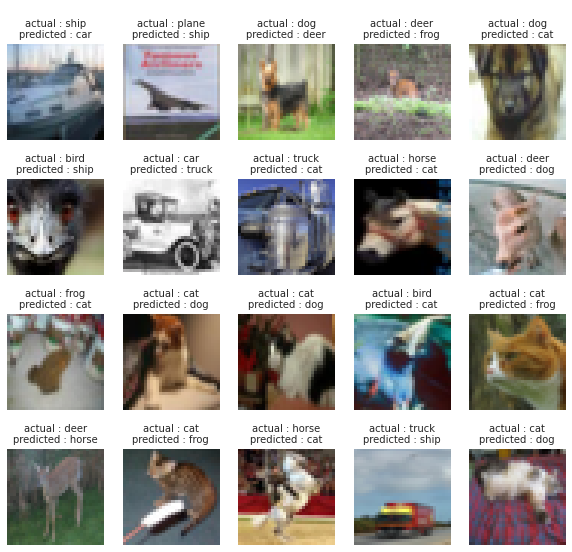

In [18]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

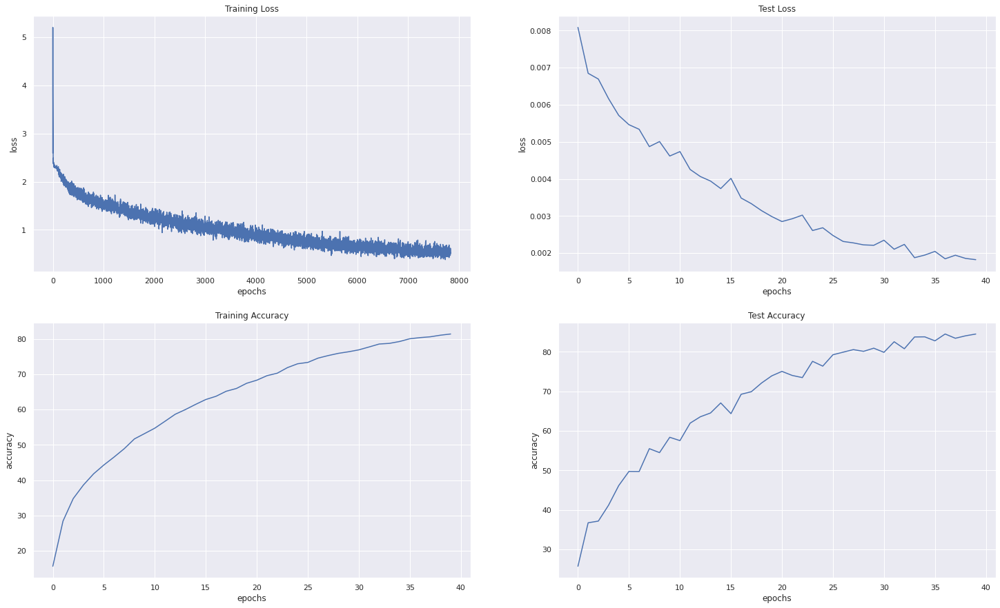

In [19]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [20]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 87 %
Accuracy of   car : 93 %
Accuracy of  bird : 71 %
Accuracy of   cat : 68 %
Accuracy of  deer : 84 %
Accuracy of   dog : 79 %
Accuracy of  frog : 94 %
Accuracy of horse : 81 %
Accuracy of  ship : 92 %
Accuracy of truck : 90 %


## Plot Confusion Matrix

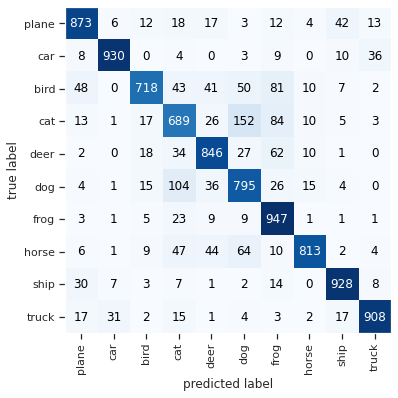

In [21]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


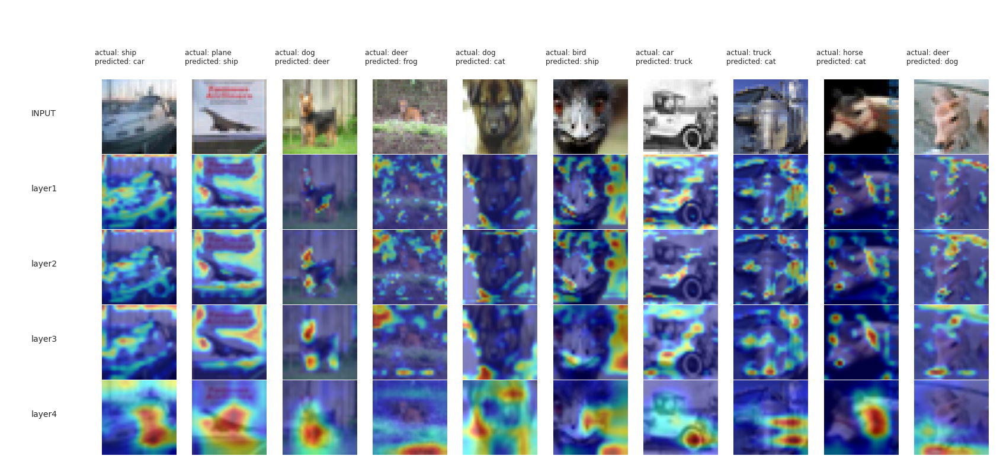

In [22]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


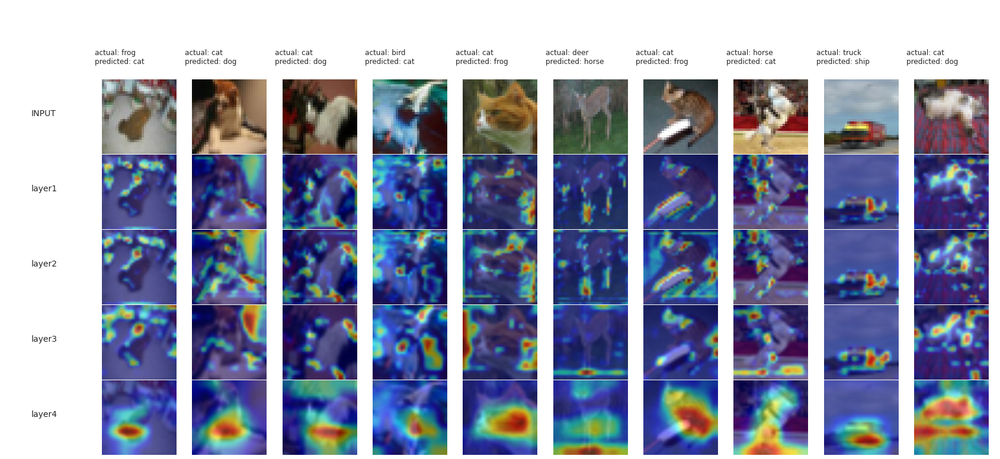

In [23]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [24]:

%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1095), started 1:01:53 ago. (Use '!kill 1095' to kill it.)

<IPython.core.display.Javascript object>